In [1]:
# unzip files in inpainting
!pwd

/content


https://github.com/naoto0804/pytorch-inpainting-with-partial-conv

In [2]:
import os

zip_file_path = '/content/pytorch-inpainting-with-partial-conv-0.0.0.zip'

# Check if the zip file exists before attempting to unzip
if os.path.exists(zip_file_path):
    # Unzip the file to the current directory
    os.system(f'unzip -q {zip_file_path} -d /content/')
    print(f'Successfully unzipped {zip_file_path} to /content/')
    # List the contents of the directory where the files were unzipped
    print('\nContents after unzipping:')
    os.system('ls -F /content/')
else:
    print(f'Error: The file {zip_file_path} does not exist.')

Successfully unzipped /content/pytorch-inpainting-with-partial-conv-0.0.0.zip to /content/

Contents after unzipping:


In [3]:
# Install dependencies from requirements.txt
# Due to issues with old versions, install numpy and Pillow without strict version constraints first.
%pip install numpy Pillow --upgrade --user
%pip install -r /content/pytorch-inpainting-with-partial-conv-0.0.0/requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.7/16.7 MB 88.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 109.6 MB/s eta 0:00:00
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.61.2 requires numpy<2.3,>=1.24, but you have numpy 2.5.2 which is incompatible.


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.3/14.3 MB 15.7 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [1]:
import sys
# Add the project directory to the Python path to import modules
sys.path.append('/content/pytorch-inpainting-with-partial-conv-0.0.0')
import os

import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import torchvision.utils as vutils

# Assuming InpaintGenerator is defined in net.py and Places2Dataset in places2.py
from net import PConvUNet # This is a common class name for the generator
from places2 import Places2 # This is a common class name for the Places2 dataset

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cpu


Now, I'll initialize the generator model and load the pre-trained weights from `iter_1000000.pth`.

In [2]:
# Initialize the generator model with common parameters for PartialConv inpainting.
# The exact constructor signature can be verified in `net.py`.
# The PConvUNet in this implementation primarily uses 'layer_size'.
generator = PConvUNet(layer_size=7).to(device) # Assuming default layer_size=7 as seen in net.py

# Load pre-trained weights
model_path = '/content/iter_1000000.pth'
if torch.cuda.is_available():
    checkpoint = torch.load(model_path)
else:
    checkpoint = torch.load(model_path, map_location=torch.device('cpu'))

# Load the state dictionary into the model
# Check if the checkpoint is a dict containing 'model' or 'state_dict' or the state_dict directly
if isinstance(checkpoint, dict) and 'model' in checkpoint:
    generator.load_state_dict(checkpoint['model'])
elif isinstance(checkpoint, dict) and 'state_dict' in checkpoint:
    generator.load_state_dict(checkpoint['state_dict'])
else:
    generator.load_state_dict(checkpoint)

generator.eval() # Set model to evaluation mode
print("Generator loaded successfully.")

Generator loaded successfully.


In [3]:
mask_output_dir = '/content/generated_masks'
os.makedirs(mask_output_dir, exist_ok=True)

image_size = 256

# Command to run generate_data.py to create masks
# We'll generate 50 masks of image_size x image_size (256x256)
# Note: This executes a Python script using the shell, so ensure its dependencies are met.
print(f"Generating 50 masks of size {image_size}x{image_size} into {mask_output_dir}...")
!python /content/pytorch-inpainting-with-partial-conv-0.0.0/generate_data.py --save_dir {mask_output_dir} --image_size {image_size} --N 50
print("Mask generation complete.")

mask_root_path = mask_output_dir

Generating 50 masks of size 256x256 into /content/generated_masks...
save: 0 52060
save: 1 51511
save: 2 53935
save: 3 54253
save: 4 51352
save: 5 51685
save: 6 53468
save: 7 51968
save: 8 51071
save: 9 51056
save: 10 55707
save: 11 52331
save: 12 52270
save: 13 52188
save: 14 52841
save: 15 53076
save: 16 52258
save: 17 49042
save: 18 52380
save: 19 51122
save: 20 53036
save: 21 55649
save: 22 52624
save: 23 50847
save: 24 53116
save: 25 55208
save: 26 54906
save: 27 49931
save: 28 55429
save: 29 52391
save: 30 50783
save: 31 51312
save: 32 50728
save: 33 53556
save: 34 53359
save: 35 52309
save: 36 53764
save: 37 52525
save: 38 52591
save: 39 50974
save: 40 54565
save: 41 54438
save: 42 50966
save: 43 50254
save: 44 51207
save: 45 51772
save: 46 51893
save: 47 54506
save: 48 51052
save: 49 52797
Mask generation complete.


In [4]:
# Define the download URL for test_256.tar
download_url = "http://data.csail.mit.edu/places/places365/test_256.tar"
# Define the directory where the dataset will be extracted
places2_extract_dir = '/content/places2_data'

os.makedirs(places2_extract_dir, exist_ok=True)

tar_file_name = os.path.join(places2_extract_dir, 'test_256.tar')

# Check if the tar file already exists and is not empty
if not os.path.exists(tar_file_name) or os.path.getsize(tar_file_name) == 0:
    print(f"Downloading {download_url} to {tar_file_name}...")
    # Use wget to download the .tar file
    wget_exit_code = os.system(f'wget -O {tar_file_name} {download_url}')

    if wget_exit_code != 0:
        print(f"Error: wget command failed with exit code {wget_exit_code}.")
        print(f"Please check the URL: {download_url}")
    else:
        print("Download complete.")
        # Verify file size after download
        if os.path.exists(tar_file_name) and os.path.getsize(tar_file_name) > 0:
            print(f"Downloaded file size: {os.path.getsize(tar_file_name) / (1024*1024):.2f} MB")
        else:
            print(f"Error: Downloaded file '{tar_file_name}' is empty or failed to download.")
else:
    print(f"'{tar_file_name}' already exists and is not empty. Skipping download.")

# Define the expected extraction path
extracted_data_path = os.path.join(places2_extract_dir, 'test_256')

# Remove existing extracted content to ensure a clean re-extraction
if os.path.exists(extracted_data_path):
    print(f"Removing existing extracted data at '{extracted_data_path}'...")
    os.system(f'rm -rf {extracted_data_path}')

print(f"Extracting '{tar_file_name}' to '{places2_extract_dir}'...")
# Use tar to extract the .tar file
os.system(f'tar -xvf {tar_file_name} -C {places2_extract_dir}')
print("Extraction complete.")

# The actual images are inside 'test_256' within the extracted directory
real_places2_dataroot = os.path.join(places2_extract_dir, 'test_256')
print(f"Places2 dataroot set to: {real_places2_dataroot}")

Download complete.
Downloaded file size: 4517.39 MB
Extracting '/content/places2_data/test_256.tar' to '/content/places2_data'...
Extraction complete.
Places2 dataroot set to: /content/places2_data/test_256


In [40]:
from PIL import Image

# Define dataroot and mask_root paths
dataroot = '/content/places2_data/test_256'
mask_root = '/content/generated_masks'

# Get list of image files and mask files
image_files = [os.path.join(dataroot, f) for f in os.listdir(dataroot) if f.endswith(('.png', '.jpg', '.jpeg'))]
mask_files = [os.path.join(mask_root, f) for f in os.listdir(mask_root) if f.endswith('.jpg')]

# Select the first 10 images and mask for testing
if image_files and mask_files:
    test_image_path = image_files[:10]
    test_mask_path = mask_files[:10]
    print(f"Selected image: {test_image_path}")
    print(f"Selected mask: {test_mask_path}")
else:
    raise FileNotFoundError("No image or mask files found in the specified directories.")


Selected image: ['/content/places2_data/test_256/Places365_test_00297720.jpg', '/content/places2_data/test_256/Places365_test_00012763.jpg', '/content/places2_data/test_256/Places365_test_00164329.jpg', '/content/places2_data/test_256/Places365_test_00103010.jpg', '/content/places2_data/test_256/Places365_test_00086904.jpg', '/content/places2_data/test_256/Places365_test_00047345.jpg', '/content/places2_data/test_256/Places365_test_00256497.jpg', '/content/places2_data/test_256/Places365_test_00310690.jpg', '/content/places2_data/test_256/Places365_test_00274729.jpg', '/content/places2_data/test_256/Places365_test_00203693.jpg']
Selected mask: ['/content/generated_masks/000016.jpg', '/content/generated_masks/000014.jpg', '/content/generated_masks/000004.jpg', '/content/generated_masks/000006.jpg', '/content/generated_masks/000000.jpg', '/content/generated_masks/000029.jpg', '/content/generated_masks/000002.jpg', '/content/generated_masks/000031.jpg', '/content/generated_masks/000048.jp

In [41]:
# Create a temporary directory for the input image and mask
temp_input_dir = '/content/temp_test_input'
os.makedirs(temp_input_dir, exist_ok=True)

# Copy the selected image and mask to the temporary input directory
import shutil

for i in range(10):
  shutil.copy(test_image_path[i], os.path.join(temp_input_dir, f'input_image{i}.jpg'))
  shutil.copy(test_mask_path[i], os.path.join(temp_input_dir, f'input_mask{i}.jpg'))

# Define the output directory for test.py results
test_output_dir = '/content/test_results'
os.makedirs(test_output_dir, exist_ok=True)

print(f"Test input image and mask prepared in {temp_input_dir}/")
print(f"Test results will be saved to {test_output_dir}/")


Test input image and mask prepared in /content/temp_test_input/
Test results will be saved to /content/test_results/


Processing image: /content/places2_data/test_256/Places365_test_00297720.jpg with mask: /content/generated_masks/000016.jpg
Saved inpainted image to /content/test_results/inpainted_result_0.png


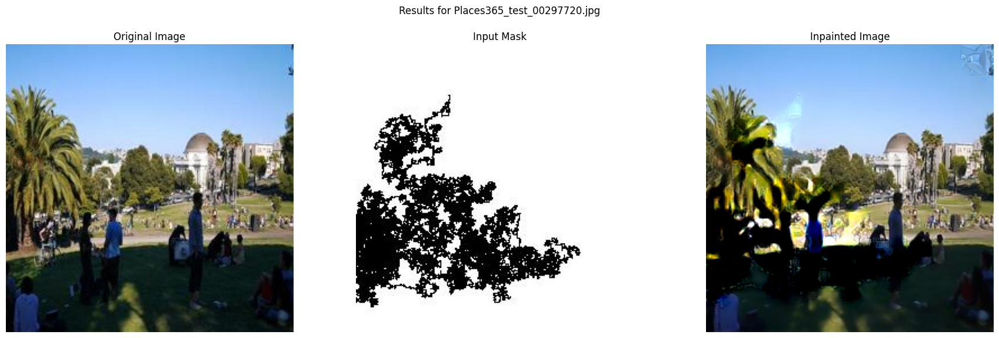

Processing image: /content/places2_data/test_256/Places365_test_00012763.jpg with mask: /content/generated_masks/000014.jpg
Saved inpainted image to /content/test_results/inpainted_result_1.png


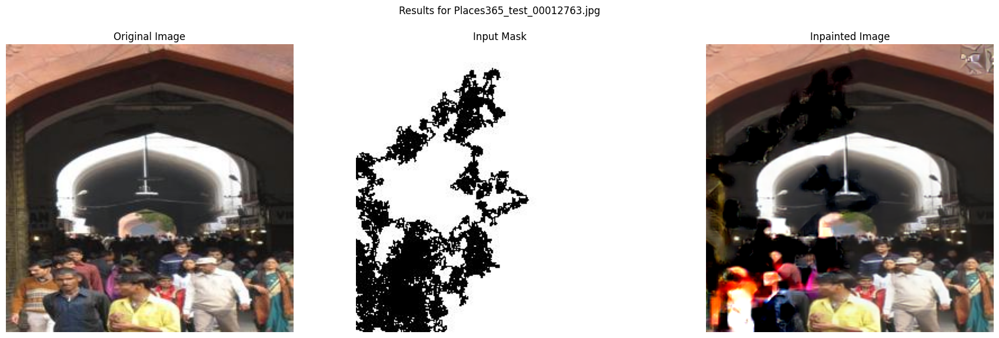

Processing image: /content/places2_data/test_256/Places365_test_00164329.jpg with mask: /content/generated_masks/000004.jpg
Saved inpainted image to /content/test_results/inpainted_result_2.png


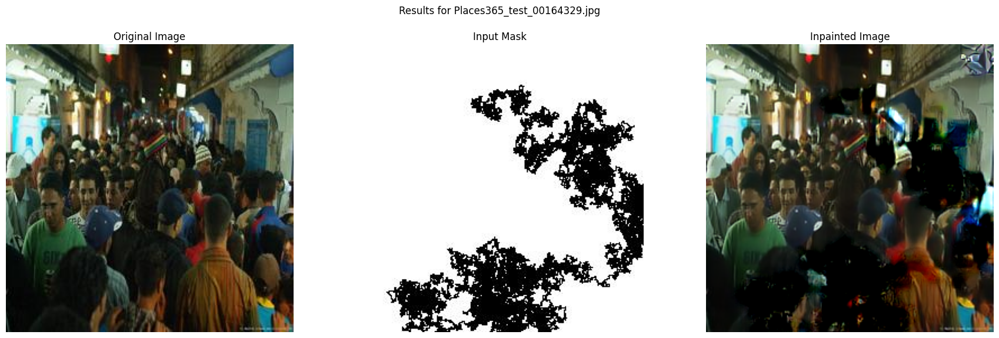

Processing image: /content/places2_data/test_256/Places365_test_00103010.jpg with mask: /content/generated_masks/000006.jpg
Saved inpainted image to /content/test_results/inpainted_result_3.png


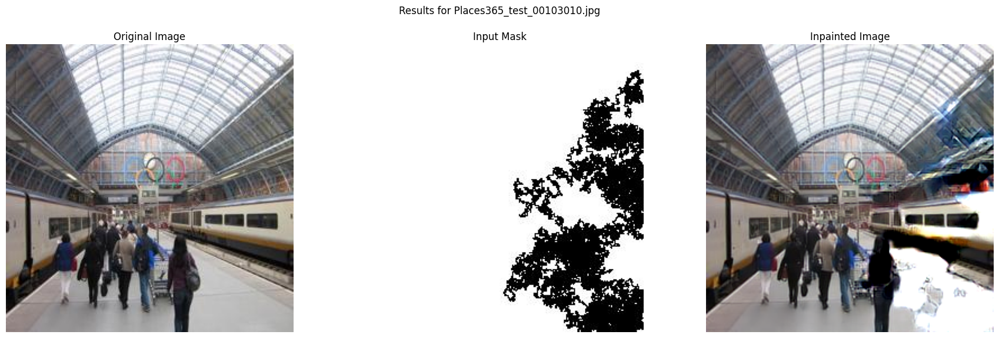

Processing image: /content/places2_data/test_256/Places365_test_00086904.jpg with mask: /content/generated_masks/000000.jpg
Saved inpainted image to /content/test_results/inpainted_result_4.png


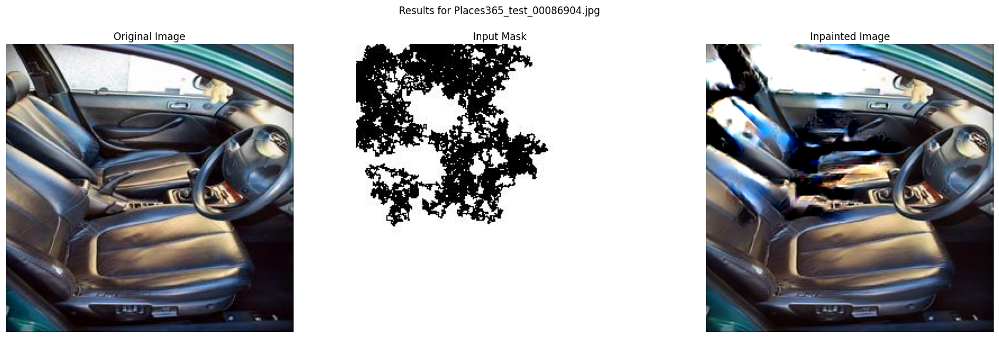

Processing image: /content/places2_data/test_256/Places365_test_00047345.jpg with mask: /content/generated_masks/000029.jpg
Saved inpainted image to /content/test_results/inpainted_result_5.png


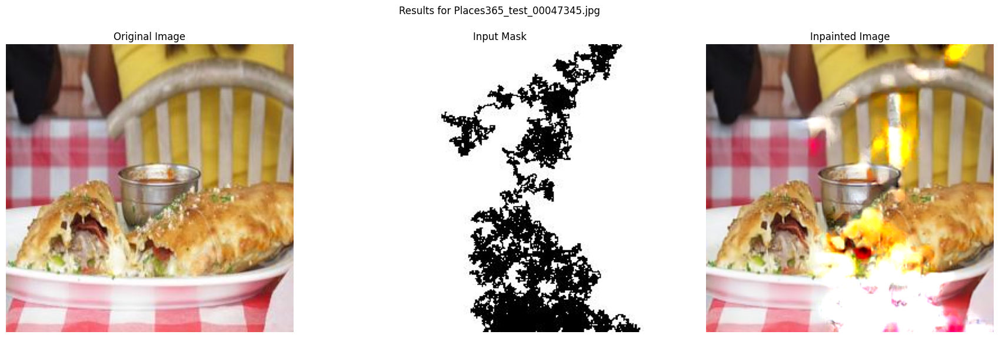

Processing image: /content/places2_data/test_256/Places365_test_00256497.jpg with mask: /content/generated_masks/000002.jpg
Saved inpainted image to /content/test_results/inpainted_result_6.png


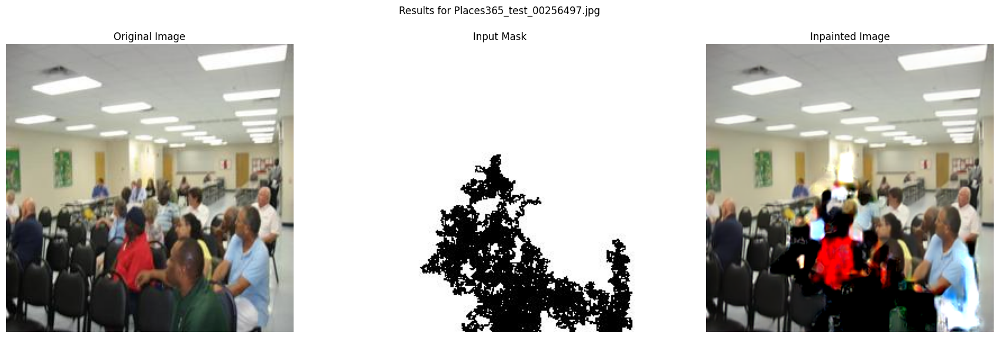

Processing image: /content/places2_data/test_256/Places365_test_00310690.jpg with mask: /content/generated_masks/000031.jpg
Saved inpainted image to /content/test_results/inpainted_result_7.png


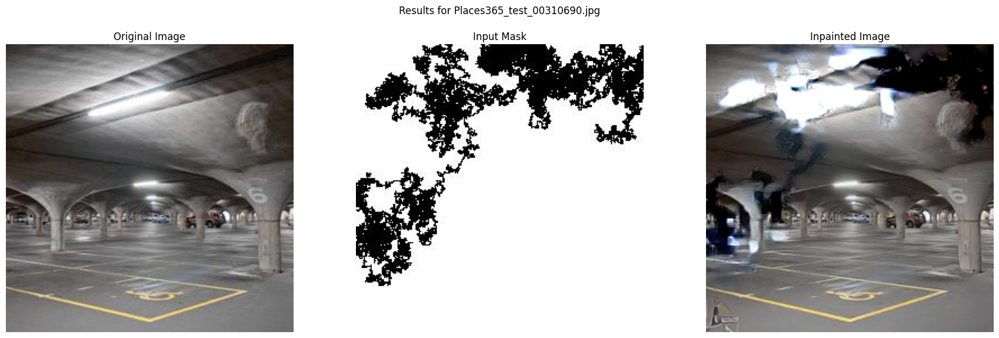

Processing image: /content/places2_data/test_256/Places365_test_00274729.jpg with mask: /content/generated_masks/000048.jpg
Saved inpainted image to /content/test_results/inpainted_result_8.png


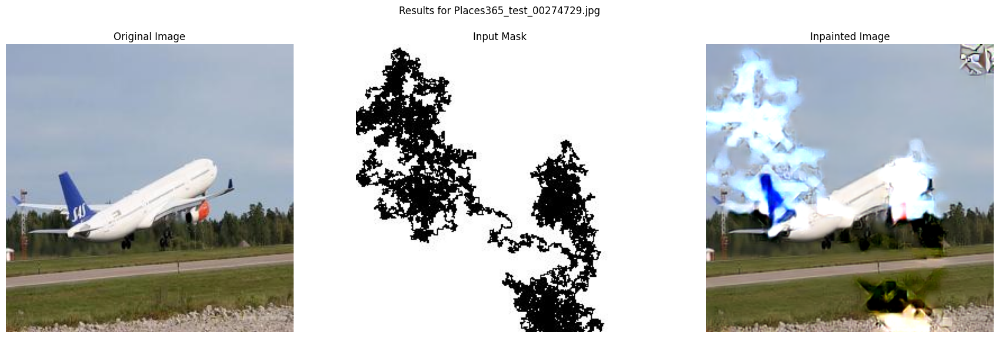

Processing image: /content/places2_data/test_256/Places365_test_00203693.jpg with mask: /content/generated_masks/000045.jpg
Saved inpainted image to /content/test_results/inpainted_result_9.png


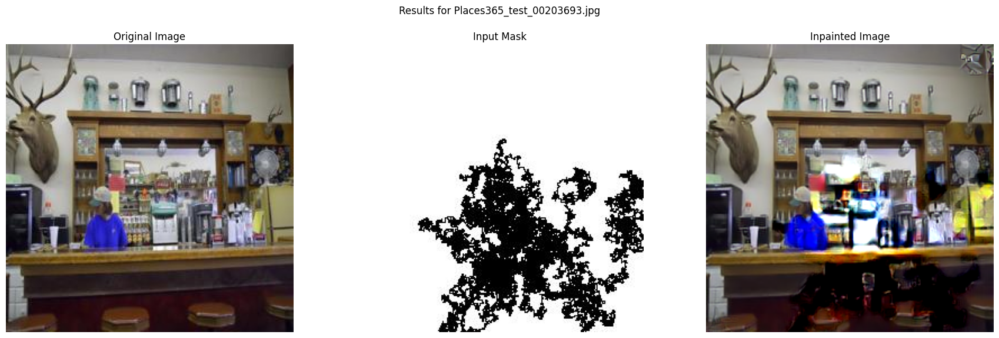

In [42]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import os
import numpy as np

# Ensure opt module is imported for MEAN and STD
import opt
from util.image import unnormalize # Import the unnormalize utility function

# The generator model and device should already be defined from previous cells
# generator, device, model_path, image_size are available

size = (image_size, image_size)
img_transform = transforms.Compose(
    [transforms.Resize(size=size), transforms.ToTensor(),
     transforms.Normalize(mean=opt.MEAN, std=opt.STD)])
mask_transform = transforms.Compose(
    [transforms.Resize(size=size), transforms.ToTensor()])

generator.eval() # Ensure model is in evaluation mode

# Loop through the selected image and mask paths
for i in range(len(test_image_path)):
    current_image_path = test_image_path[i]
    current_mask_path = test_mask_path[i]

    print(f"Processing image: {current_image_path} with mask: {current_mask_path}")

    # Load image and mask
    img = Image.open(current_image_path).convert('RGB')
    mask = Image.open(current_mask_path).convert('RGB') # Masks might be grayscale, convert to RGB for consistency

    # Apply transforms
    input_img_tensor = img_transform(img).unsqueeze(0).to(device) # Add batch dimension
    input_mask_tensor = mask_transform(mask).unsqueeze(0).to(device) # Add batch dimension

    with torch.no_grad():
        output_tensor, _ = generator(input_img_tensor, input_mask_tensor) # Unpack the tuple output

    # Post-process output for display
    # Denormalize the original input image tensor for display
    original_img_denorm = unnormalize(input_img_tensor.cpu()).squeeze(0) # Pass 4D tensor, then squeeze(0)
    original_img_denorm = original_img_denorm.clamp(0, 1)

    # Denormalize the model output tensor for display
    output_denorm = unnormalize(output_tensor.cpu()).squeeze(0) # Pass 4D tensor, then squeeze(0)
    output_denorm = output_denorm.clamp(0, 1)

    # Convert tensors back to PIL Image for display
    original_display = transforms.ToPILImage()(original_img_denorm)
    mask_display = transforms.ToPILImage()(input_mask_tensor.cpu().squeeze(0).mean(dim=0, keepdim=True).repeat(3,1,1))
    output_display = transforms.ToPILImage()(output_denorm)

    # Create a temporary output path for saving
    output_file_name = f"inpainted_result_{i}.png"
    output_full_path = os.path.join(test_output_dir, output_file_name)
    output_display.save(output_full_path)
    print(f"Saved inpainted image to {output_full_path}")

    # Display the generated images (original, masked, and inpainted)
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(original_display)
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(mask_display)
    axes[1].set_title('Input Mask')
    axes[1].axis('off')

    axes[2].imshow(output_display)
    axes[2].set_title('Inpainted Image')
    axes[2].axis('off')

    plt.suptitle(f"Results for {os.path.basename(current_image_path)}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


In [45]:
!python /content/pytorch-inpainting-with-partial-conv-0.0.0/test.py --root /content/temp_test_input/images/  --mask_root /content/temp_test_input/masks/ --snapshot /content/iter_1000000.pth --image_size 256

Top to bottom: input, mask, image generated by the network, image which is combined with the original non-masked region of image, ground truth)

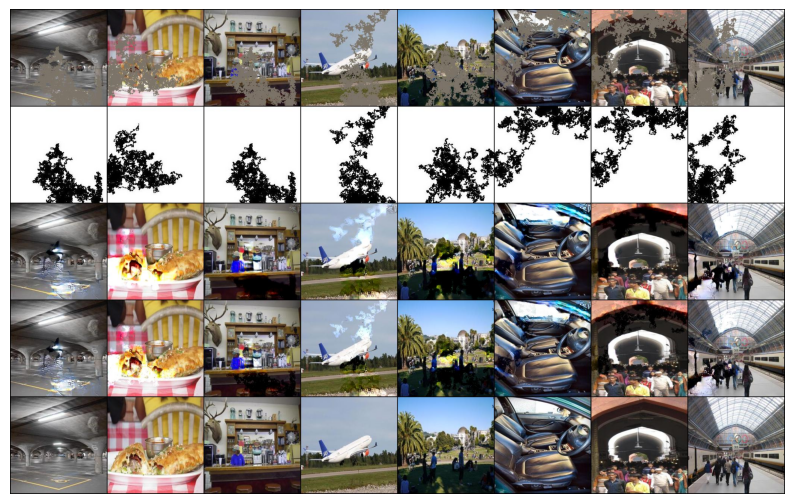

In [46]:
# Load and show result.jpg from the test script
result_image_path = '/content/result.jpg'
result_image = Image.open(result_image_path)
plt.figure(figsize=(10, 10))
plt.imshow(result_image)
plt.axis('off')
plt.show()